In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random
import lightgbm as lgb
from sklearn.model_selection import KFold
from imblearn.metrics import  geometric_mean_score
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score, f1_score, precision_recall_curve, precision_score 
from sklearn.metrics import recall_score, average_precision_score, auc
from sklearn.ensemble import RandomForestClassifier
from imblearn.under_sampling import NearMiss, RandomUnderSampler
from imblearn.over_sampling import SMOTE, ADASYN

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be import

In [3]:
missing_values = ["n/a", "na", "--", "?"]
df = pd.read_csv('/content/germancredit.csv',  delimiter=',', na_values = missing_values)

df



,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk
0,67,male,2,own,NaN,little,1169,6,radio/TV,good
1,22,female,2,own,little,moderate,5951,48,radio/TV,bad
2,49,male,1,own,little,NaN,2096,12,education,good
3,45,male,2,free,little,little,7882,42,furniture/equipment,good
4,53,male,2,free,little,little,4870,24,car,bad
...,...,...,...,...,...,...,...,...,...,...
995,31,female,1,own,little,NaN,1736,12,furniture/equipment,good
996,40,male,3,own,little,little,3857,30,car,good
997,38,male,2,own,little,NaN,804,12,radio/TV,good
998,23,male,2,free,little,little,1845,45,radio/TV,bad


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Age               1000 non-null   int64 
 1   Sex               1000 non-null   object
 2   Job               1000 non-null   int64 
 3   Housing           1000 non-null   object
 4   Saving accounts   817 non-null    object
 5   Checking account  606 non-null    object
 6   Credit amount     1000 non-null   int64 
 7   Duration          1000 non-null   int64 
 8   Purpose           1000 non-null   object
 9   Risk              1000 non-null   object
dtypes: int64(4), object(6)
memory usage: 78.2+ KB


Age                   0
Sex                   0
Job                   0
Housing               0
Saving accounts     183
Checking account    394
Credit amount         0
Duration              0
Purpose               0
Risk                  0
dtype: int64


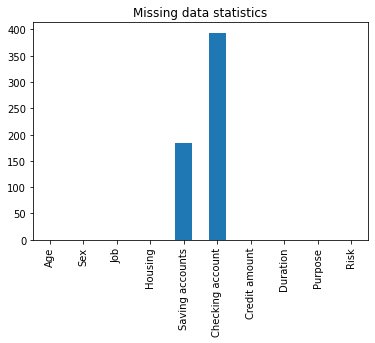

In [5]:
c = df.isnull().sum()
plt.title("Missing data statistics")
c.plot(kind='bar')
print(c)

In [6]:
for col in ['Saving accounts', 'Checking account']:
    df[col].fillna('no_accounts', inplace=True)

Age                 0
Sex                 0
Job                 0
Housing             0
Saving accounts     0
Checking account    0
Credit amount       0
Duration            0
Purpose             0
Risk                0
dtype: int64


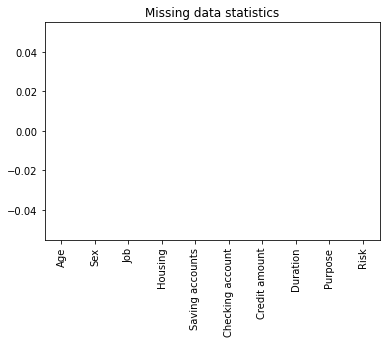

In [7]:
c = df.isnull().sum()
plt.title("Missing data statistics")
c.plot(kind='bar')
print(c)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Age               1000 non-null   int64 
 1   Sex               1000 non-null   object
 2   Job               1000 non-null   int64 
 3   Housing           1000 non-null   object
 4   Saving accounts   1000 non-null   object
 5   Checking account  1000 non-null   object
 6   Credit amount     1000 non-null   int64 
 7   Duration          1000 non-null   int64 
 8   Purpose           1000 non-null   object
 9   Risk              1000 non-null   object
dtypes: int64(4), object(6)
memory usage: 78.2+ KB


Count of Good Credits 700
Count of Bad Credits 300


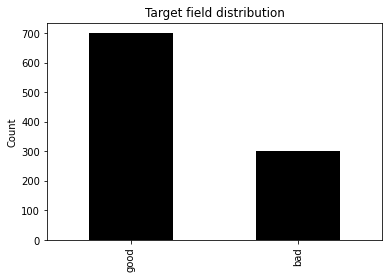

In [9]:
good, bad = df['Risk'].value_counts()
print('Count of Good Credits', good)
print('Count of Bad Credits', bad)
df['Risk'].value_counts().plot(kind='bar', title='Target field distribution', color='black')

plt.ylabel('Count')
plt.show()

In [10]:
# getting dummies for all the categorical variables
dummies_columns = ['Purpose', 'Sex', 'Housing', 'Saving accounts', 'Checking account']
for col in dummies_columns:
    df = df.merge(pd.get_dummies(df[col], drop_first=True, prefix=str(col)), left_index=True, right_index=True) 

# encoding risk as binary
r = {"good":0, "bad": 1}
df['Risk'] = df['Risk'].map(r)

# drop redundant variables
columns_to_drop = ['Purpose','Sex','Housing','Saving accounts','Checking account']
df.drop(columns_to_drop, axis=1, inplace=True)

df.head()


,Age,Job,Credit amount,Duration,Risk,Purpose_car,Purpose_domestic appliances,Purpose_education,Purpose_furniture/equipment,Purpose_radio/TV,Purpose_repairs,Purpose_vacation/others,Sex_male,Housing_own,Housing_rent,Saving accounts_moderate,Saving accounts_no_accounts,Saving accounts_quite rich,Saving accounts_rich,Checking account_moderate,Checking account_no_accounts,Checking account_rich
0,67,2,1169,6,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0
1,22,2,5951,48,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0
2,49,1,2096,12,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0
3,45,2,7882,42,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0
4,53,2,4870,24,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype
---  ------                        --------------  -----
 0   Age                           1000 non-null   int64
 1   Job                           1000 non-null   int64
 2   Credit amount                 1000 non-null   int64
 3   Duration                      1000 non-null   int64
 4   Risk                          1000 non-null   int64
 5   Purpose_car                   1000 non-null   uint8
 6   Purpose_domestic appliances   1000 non-null   uint8
 7   Purpose_education             1000 non-null   uint8
 8   Purpose_furniture/equipment   1000 non-null   uint8
 9   Purpose_radio/TV              1000 non-null   uint8
 10  Purpose_repairs               1000 non-null   uint8
 11  Purpose_vacation/others       1000 non-null   uint8
 12  Sex_male                      1000 non-null   uint8
 13  Housing_own                   1000

In [12]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
data = df[['Credit amount']]

df[['Credit amount']] = scaler.fit_transform(data)

df

,Age,Job,Credit amount,Duration,Risk,Purpose_car,Purpose_domestic appliances,Purpose_education,Purpose_furniture/equipment,Purpose_radio/TV,Purpose_repairs,Purpose_vacation/others,Sex_male,Housing_own,Housing_rent,Saving accounts_moderate,Saving accounts_no_accounts,Saving accounts_quite rich,Saving accounts_rich,Checking account_moderate,Checking account_no_accounts,Checking account_rich
0,67,2,-0.745131,6,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0
1,22,2,0.949817,48,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0
2,49,1,-0.416562,12,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0
3,45,2,1.634247,42,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0
4,53,2,0.566664,24,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,31,1,-0.544162,12,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0
996,40,3,0.207612,30,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0
997,38,2,-0.874503,12,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0
998,23,2,-0.505528,45,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0


In [13]:
pd.set_option('max_columns', None)

In [14]:
df.groupby(df['Risk']).agg(['min', 'max'])

Age     Job     Credit amount           Duration     Purpose_car      \
     min max min max           min       max      min max         min max   
Risk                                                                        
0     19  75   0   3     -1.070865  4.460933        4  60           0   1   
1     19  74   0   3     -1.006002  5.370789        6  72           0   1   

     Purpose_domestic appliances     Purpose_education      \
                             min max               min max   
Risk                                                         
0                              0   1                 0   1   
1                              0   1                 0   1   

     Purpose_furniture/equipment     Purpose_radio/TV     Purpose_repairs      \
                             min max              min max             min max   
Risk                                                                            
0                              0   1                0   1               0   1   
1                              0   1                0   1               0   1   

     Purpose_vacation/others     Sex_male     Housing_own     Housing_rent  \
                         min max      min max         min max          min   
Risk                                                                         
0                          0   1        0   1           0   1            0   
1                          0   1        0   1           0   1            0   

         Saving accounts_moderate     Saving accounts_no_accounts      \
     max                      min max                         min max   
Risk                                                                    
0      1                        0   1                           0   1   
1      1                        0   1                           0   1   

     Saving accounts_quite rich     Saving accounts_rich      \
                            min max                  min max   
Risk                                                           
0                             0   1                    0   1   
1                             0   1                    0   1   

     Checking account_moderate     Checking account_no_accounts      \
                           min max                          min max   
Risk                                                                  
0                            0   1                            0   1   
1                            0   1                            0   1   

     Checking account_rich      
                       min max  
Risk                            
0                        0   1  
1                        0   1

In [15]:
x= df.drop(['Risk'], axis=1)
x
y = df['Risk']
print(x)


     Age  Job  Credit amount  Duration  Purpose_car  \
0     67    2      -0.745131         6            0   
1     22    2       0.949817        48            0   
2     49    1      -0.416562        12            0   
3     45    2       1.634247        42            0   
4     53    2       0.566664        24            1   
..   ...  ...            ...       ...          ...   
995   31    1      -0.544162        12            0   
996   40    3       0.207612        30            1   
997   38    2      -0.874503        12            0   
998   23    2      -0.505528        45            0   
999   27    2       0.462457        45            1   

     Purpose_domestic appliances  Purpose_education  \
0                              0                  0   
1                              0                  0   
2                              0                  1   
3                              0                  0   
4                              0                  0   
..       

# AIS Algorithm functions

In [16]:
def initilization_of_population_featurebased(size,n_feat):
    population = []
    #chromosome = []
    for j in range(size): 
        chromosome = []    #chromosome type is list
        for i in range(n_feat):
            if i == 0:
                gene = random.randint(19, 74)
            elif i == 1:
                gene = random.randint(0,3)
            elif i == 2:
                gene = round(random.uniform(-1.006002,5.370789),4)
            elif i == 3:
                gene = random.randint(6,72)
            elif i == 4:
                gene = random.randint(22,43)
            else:
                gene = random.randint(0,1)
            chromosome.append(gene)
        population.append(chromosome)
    return(population)

In [ ]:
print(initilization_of_population_featurebased(2,21))

[[32, 0, 2.305, 21, 27, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1], [46, 1, 0.5804, 34, 24, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0]]


In [18]:
def fitness_score(population,model,X_train,X_test, y_train, y_test):
    scores = []
    for chromosome in population:
        a_series = pd.Series(chromosome, index = X_train.columns)
        b_series = pd.Series([1])
        X_train_with_chromosome = X_train.append(a_series, ignore_index=True)
        y_train_with_chromosome = y_train.append(b_series, ignore_index=True)
        model.fit(X_train_with_chromosome,np.ravel(y_train_with_chromosome))
        predictions = model.predict(X_test)
        scores.append(f1_score(np.ravel(y_test), predictions))
    scores, population = np.array(scores), np.array(population) # list of arrays scores = [[array1],[array2]]
    inds = np.argsort(scores) #[2, 3, 1, 0] indicates that the smallest element is at index 2, the next smallest at index 3, then index 1, then index 0.
    return list(scores[inds][::-1]), list(population[inds,:][::-1]) #list of list (converting each array such as array, array2  0 to list in sorted order)

In [19]:
def selection(pop_after_fit,n_parents):
    population_nextgen = [] #New array 
    for i in range(n_parents): 
        population_nextgen.append(pop_after_fit[i])  # append the best chromosomes as parents from results after fit function
    return population_nextgen 

In [20]:
def clone(pop_after_sel, clone_rate):
    population_next_gen_cloned = []
    population_next_gen=pop_after_sel
    for x in range(clone_rate):
            for i in range(len(population_next_gen)):
                clones = population_next_gen[i]
                population_next_gen_cloned.append(clones)
    return population_next_gen_cloned
    

In [21]:
def mutation_clone(pop_after_clone,mutation_rate):
    population_nextgen = []
    for i in range(0,len(pop_after_clone)):  #consider each chromoseome from the cross over set
        chromosome = pop_after_clone[i]  #take in sequence one after other chromosomes
        for j in range(len(chromosome)):  #with the one chromosome array
                if j == 2:
                    chromosome[j] = round(float(chromosome[j] + (mutation_rate)),4)
                else:
                    chromosome[j] = int(chromosome[j] + (mutation_rate ))
        population_nextgen.append(chromosome)  #append all the changed ones to next_gen
    
    return population_nextgen

In [22]:
def generations(size,n_feat,n_parents,mutation_rate, clone_rate,model,X_train,X_test, y_train, y_test):
    best_chromo= []
    best_score= []
    stop_condition = True
    i = 0
    fscore_counter = 0
    bestscore_counter = 0
    population_nextgen=initilization_of_population_featurebased(size,n_feat)
    print('Initial random population based on minority class features')
    print(population_nextgen)
    while stop_condition:
        print(i)
        print('--------------------------------------------------------------------------')
        scores, pop_after_fit = fitness_score(population_nextgen, model,X_train,X_test, y_train, y_test)
        print('Scores of each chromosomes in sorted order')
        print(scores)
        print('Chromosome set sorted and corresponding to scores')
        print(pop_after_fit)
        pop_after_sel = selection(pop_after_fit,n_parents)
        print('Selects the best parents to generate better chromosomes for next generation')
        print(pop_after_sel)
        print("Clone after selection based on clone_rate")
        pop_after_clone = clone(pop_after_sel, clone_rate)
        print(pop_after_clone)
        print('Mutate the cloned population')
        population_nextgen = mutation_clone(pop_after_clone,mutation_rate)
        print(population_nextgen)
        if i > 0:
             if round(best_score[-1],5) >= round(scores[0],5):
                    print("Checking if the values are degrading or equal")
                    fscore_counter = fscore_counter + 1
                    print(fscore_counter)
                    if fscore_counter == 10 :
                        print("&&&&&&&&&--------Fscore_counter is checked and near to 10--------&&&&&&&&&&&&&")
                        stop_condition = False
                        
             elif stop_condition == True:
                if round(best_score[-1],5) < round(scores[0],5):
                    print("&&&&&&&&&&&&&&-----Fscore_counter is recompiled to O-------&&&&&&&&&&&&&&&&&")
                    fscore_counter = 0
             if stop_condition == True:
                if len(best_score) > 150:
                    print("-----Length of best score is exceeded so stopping the AIS now--------")
                    stop_condition = False
             #else:
               # stop_condition = True
                    
        i = i + 1
        
        best_chromo.append(pop_after_fit[0])
        best_score.append(scores[0])
        print('best score and chromosome')
        print(best_chromo)
        print(best_score)
        
    return best_chromo, best_score

In [23]:
def update_AIS_GeneratedSample_in_TrainSet(chromo,Initial_X_train,Initial_y_train):
    X_train = Initial_X_train
    y_train = Initial_y_train
    for best_chromo in chromo:
        X_train_bestchromo = []
        a_series = pd.Series(best_chromo, index = X_train.columns)
        b_series = pd.Series([1])
        X_train_bestchromo = X_train.append(a_series, ignore_index=True)
        X_train = X_train_bestchromo
        y_train_bestchromo = y_train.append(b_series)
        y_train = y_train_bestchromo
    return X_train, y_train

In [24]:
def modelling_using_AIS_SampledTrainset(AIS_X_train, AIS_y_train, AIS_X_test, AIS_y_test,classifier):
    model = classifier
    model.fit(AIS_X_train,np.ravel(AIS_y_train))
    predictions = model.predict(AIS_X_test)
    acc, recal, precis, aucroc, gmean, _val = evaluation(predictions, AIS_y_test)
    
    return acc, recal, precis, aucroc, gmean, _val
    
    

In [25]:
def evaluation(pred_values, y_test):
    
    acc = accuracy_score(np.ravel(y_test), pred_values)
    recal = recall_score(np.ravel(y_test), pred_values)
    precis = precision_score(np.ravel(y_test), pred_values)
    #val = f1_score(y_test, pred_values)
    aucroc = roc_auc_score(np.ravel(y_test), pred_values)
    _val = f1_score(np.ravel(y_test), pred_values)
    gmean = geometric_mean_score(np.ravel(y_test), pred_values)
    
    return acc, recal, precis, aucroc, gmean, _val

# AIS algorithm on Train and Test datasets function

In [29]:
def AIS_sampling_and_modelling(x,y,model,size,n_feat,n_parents,mutation_rate,clone_rate,foldvalue):
    kf = KFold(n_splits=foldvalue, shuffle = True, random_state=1)
    k = foldvalue
    acc_score = []
    recal_score = []
    pres_score = []
    _fscore = []
    aucroc_score = []
    gmean_score = []
    classifier = model
    for train_index , test_index in kf.split(x):
        print('--------------------------*****START OF FOLD*******--------------------------------------')
        X_train , X_test = x.iloc[train_index,:],x.iloc[test_index,:]
        y_train , y_test = y.iloc[train_index] , y.iloc[test_index]
        Initial_X_train = X_train
        Initial_y_train = y_train
        print('Population generation using {0} Classifier'.format(model))
        print('------------------******AIS STARTED****---------------------------------------------')
        chromo,score=generations(size=size,n_feat=n_feat,n_parents=n_parents,mutation_rate=mutation_rate,clone_rate=clone_rate,
                     model = model,X_train=X_train,y_train=y_train,X_test=X_test,y_test=y_test)
        print('-----------------------***AIS ENDED****---------------------------------------------')
        X_train_AISsampled, y_train_AISsampled = update_AIS_GeneratedSample_in_TrainSet(chromo,Initial_X_train,Initial_y_train)
        print('-------------------******METRICS CALCULATION FOR THIS FOLD STARTED*****--------------')
        acc, recal, precis, aucroc, gmean, _val = modelling_using_AIS_SampledTrainset(X_train_AISsampled, y_train_AISsampled, X_test, y_test, model)
        acc_score.append(acc)
        recal_score.append(recal)
        pres_score.append(precis)
        _fscore.append(_val)
        aucroc_score.append(aucroc)
        gmean_score.append(gmean)
        print('-------------*******CALCULATED METRICS FOR THIS FOLD***--------------')
        print('-----------------------****END OF FOLD*****------------------------------------------------')                  
    avg_acc_score = sum(acc_score)/k
    avg_recal_score = sum(recal_score)/k
    avg_precis_score = sum(pres_score)/k
    avg_f_score = sum(_fscore)/k
    avg_auc_score = sum(aucroc_score)/k
    avg_gmean_score = sum(gmean_score)/k
    print('Metrics for each fold of {0} using AIS algorithm'.format(classifier))
    print('Accuracy : {0}'.format(acc_score))
    print('Avg accuracy : {}'.format(avg_acc_score))
    print('Recall : {0}'.format(recal_score))
    print('Avg recall : {}'.format(avg_recal_score))
    print('Precision : {0}'.format(pres_score))
    print('Avg precision : {}'.format(avg_precis_score))
    print('F1_score : {0}'.format(_fscore))
    print('Avg f-score : {}'.format(avg_f_score))
    print('AUC_ROC : {0}'.format(aucroc_score))
    print('Avg AUC_ROC : {}'.format(avg_auc_score))
    print('Geometric mean : {0}'.format(gmean_score))
    print('Avg gmean : {}'.format(avg_gmean_score))
        

In [30]:
def AIS_with_resampling(x,y,model,sampler,size,n_feat,n_parents,mutation_rate,clone_rate,foldvalue):
    kf = KFold(n_splits=foldvalue, shuffle = True, random_state=1)
    k = foldvalue
    acc_score = []
    recal_score = []
    pres_score = []
    _fscore = []
    aucroc_score = []
    gmean_score = []
    classifier = model
    sampleclassifier = sampler
    for train_index , test_index in kf.split(x):
        print('--------------------------*****START OF FOLD*******--------------------------------------')
        X_train , X_test = x.iloc[train_index,:],x.iloc[test_index,:]
        y_train , y_test = y.iloc[train_index] , y.iloc[test_index]
        Initial_X_train = X_train
        Initial_y_train = y_train
        print('Population generation using {0} Classifier'.format(model))
        print('------------------******AIS STARTED****---------------------------------------------')
        chromo,score=generations(size=size,n_feat=n_feat,n_parents=n_parents,mutation_rate=mutation_rate,clone_rate=clone_rate,
                     model = model,X_train=X_train,y_train=y_train,X_test=X_test,y_test=y_test)
        print('-----------------------***AIS ENDED****---------------------------------------------')
        X_train_AISsampled, y_train_AISsampled = update_AIS_GeneratedSample_in_TrainSet(chromo,Initial_X_train,Initial_y_train)
        print('----------------*****Applying sampling {0} technique on updated AIS train datasets******----------'.format(sampleclassifier))
        AIS_X_train_sampled, AIS_y_train_sampled = sampleclassifier.fit_resample(X_train_AISsampled, np.ravel(y_train_AISsampled))
        print('-------------------******METRICS CALCULATION FOR THIS FOLD STARTED*****--------------')
        acc, recal, precis, aucroc, gmean, _val = modelling_using_AIS_SampledTrainset(AIS_X_train_sampled, AIS_y_train_sampled, X_test, y_test, model)
        acc_score.append(acc)
        recal_score.append(recal)
        pres_score.append(precis)
        _fscore.append(_val)
        aucroc_score.append(aucroc)
        gmean_score.append(gmean)
        print('-------------*******CALCULATED METRICS FOR THIS FOLD***--------------')
        print('-----------------------****END OF FOLD*****------------------------------------------------')                  
    avg_acc_score = sum(acc_score)/k
    avg_recal_score = sum(recal_score)/k
    avg_precis_score = sum(pres_score)/k
    avg_f_score = sum(_fscore)/k
    avg_auc_score = sum(aucroc_score)/k
    avg_gmean_score = sum(gmean_score)/k
    print('Metrics for each fold of {0} using AIS algorithm'.format(classifier))
    print('Accuracy : {0}'.format(acc_score))
    print('Avg accuracy : {}'.format(avg_acc_score))
    print('Recall : {0}'.format(recal_score))
    print('Avg recall : {}'.format(avg_recal_score))
    print('Precision : {0}'.format(pres_score))
    print('Avg precision : {}'.format(avg_precis_score))
    print('F1_score : {0}'.format(_fscore))
    print('Avg f-score : {}'.format(avg_f_score))
    print('AUC_ROC : {0}'.format(aucroc_score))
    print('Avg AUC_ROC : {}'.format(avg_auc_score))
    print('Geometric mean : {0}'.format(gmean_score))
    print('Avg gmean : {}'.format(avg_gmean_score))
        

# Random Forest with AIS

In [ ]:
RandomForestModel = RandomForestClassifier(random_state = 24)
random.seed(1)

AIS_sampling_and_modelling(x,y,model = RandomForestModel,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using RandomForestClassifier(random_state=24) Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[27, 0, 0.6205, 69, 36, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0], [20, 0, 4.9828, 54, 43, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], [59, 2, -0.2351, 48, 38, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1], [61, 0, 3.958, 72, 34, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1], [48, 2, 3.1977, 6, 34, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0], [70, 1, 3.0456, 29, 24, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0], [29, 2, 2.357, 27, 43, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [65, 1, 5.1512, 61, 22, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0], [66, 2, -0.2045, 33, 23, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1], [31, 2, -0.3745, 61, 40, 0, 1,

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
AdaBoostModel = AdaBoostClassifier()

In [ ]:
random.seed(1)

AIS_sampling_and_modelling(x,y,model = AdaBoostModel,size = 10,n_feat = x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using AdaBoostClassifier() Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[27, 0, 0.6205, 69, 36, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0], [20, 0, 4.9828, 54, 43, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], [59, 2, -0.2351, 48, 38, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1], [61, 0, 3.958, 72, 34, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1], [48, 2, 3.1977, 6, 34, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0], [70, 1, 3.0456, 29, 24, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0], [29, 2, 2.357, 27, 43, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [65, 1, 5.1512, 61, 22, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0], [66, 2, -0.2045, 33, 23, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1], [31, 2, -0.3745, 61, 40, 0, 1, 0, 1, 1, 1, 0, 1, 

In [ ]:
lgbmodel = lgb.LGBMClassifier(objective='binary', random_state=0, n_jobs=-1)

In [ ]:
random.seed(1)

AIS_sampling_and_modelling(x,y,model = lgbmodel,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using LGBMClassifier(objective='binary', random_state=0) Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[27, 0, 0.6205, 69, 36, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0], [20, 0, 4.9828, 54, 43, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0], [59, 2, -0.2351, 48, 38, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1], [61, 0, 3.958, 72, 34, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1], [48, 2, 3.1977, 6, 34, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0], [70, 1, 3.0456, 29, 24, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0], [29, 2, 2.357, 27, 43, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [65, 1, 5.1512, 61, 22, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0], [66, 2, -0.2045, 33, 23, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1], [31, 2, -0.3745, 61

# Resampling with AIS

In [26]:
sampler_smt = SMOTE(random_state=0)


In [ ]:
AIS_with_resampling(x,y,model = RandomForestModel,sampler = sampler_smt,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using RandomForestClassifier(random_state=24) Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[59, 0, 2.5846, 20, 29, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], [40, 2, -0.1168, 38, 26, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1], [65, 1, -0.4075, 48, 30, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0], [57, 0, 0.1109, 33, 35, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0], [28, 0, 4.819, 24, 43, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0], [71, 1, 1.414, 18, 36, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [52, 2, 2.5078, 51, 37, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1], [37, 2, 1.8063, 36, 42, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0], [34, 2, 5.2106, 48, 43, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1], [45, 0, 4.0891, 15, 27, 1, 1,

In [ ]:
sampler_ada = ADASYN(random_state=0)

In [ ]:
AIS_with_resampling(x,y,model = RandomForestModel,sampler = sampler_ada,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using RandomForestClassifier(random_state=24) Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[66, 2, 3.0978, 55, 32, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1], [39, 3, 3.4004, 33, 27, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [39, 3, 5.3419, 55, 43, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0], [70, 3, 5.0646, 20, 39, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0], [46, 1, 4.4122, 46, 41, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0], [36, 2, 5.2635, 55, 37, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], [47, 3, 3.2477, 24, 35, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [69, 3, 2.6144, 12, 27, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1], [26, 1, 3.0476, 21, 35, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0], [53, 3, 3.0953, 58, 29, 1, 1,

In [ ]:
AIS_with_resampling(x,y,model = AdaBoostModel,sampler = sampler_ada,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using AdaBoostClassifier() Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[65, 1, 4.3647, 66, 43, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0], [46, 2, 2.3188, 32, 30, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0], [43, 0, -0.4146, 32, 32, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1], [20, 3, -0.8398, 41, 43, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [56, 3, 2.8197, 71, 43, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0], [30, 2, 3.8149, 61, 31, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0], [35, 1, 2.8062, 31, 24, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0], [58, 3, 2.4376, 48, 43, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0], [36, 1, 3.7014, 34, 27, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1], [68, 2, 2.9311, 42, 30, 1, 1, 0, 1, 0, 1, 0, 0

In [ ]:
AIS_with_resampling(x,y,model = AdaBoostModel,sampler = sampler_smt,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using AdaBoostClassifier() Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[57, 2, -0.6124, 36, 27, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0], [43, 2, 5.0992, 13, 43, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0], [58, 1, 1.676, 38, 41, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1], [51, 3, 4.4409, 72, 23, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [53, 0, 0.386, 18, 27, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0], [20, 0, 4.6274, 32, 41, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1], [49, 3, 1.3429, 58, 26, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0], [33, 2, 3.9683, 52, 27, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1], [50, 1, 1.0474, 32, 34, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1], [21, 3, -0.4929, 9, 40, 1, 1, 1, 0, 1, 1, 1, 1, 1

In [27]:
lgbmodel = lgb.LGBMClassifier(objective='binary', random_state=0, n_jobs=-1)

In [31]:
AIS_with_resampling(x,y,model = lgbmodel,sampler = sampler_smt,size = 10,n_feat =x.shape[1] ,n_parents = 6,mutation_rate = 0.10,
                           clone_rate = 6 ,foldvalue = 5)

--------------------------*****START OF FOLD*******--------------------------------------
Population generation using LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective='binary',
               random_state=0, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0) Classifier
------------------******AIS STARTED****---------------------------------------------
Initial random population based on minority class features
[[39, 2, 5.1683, 53, 35, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1], [47, 1, 0.4033, 26, 29, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [72, 2, 1.5237, 68, 37, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [55, 0, 4.1369, 23, 27, 0, 1, 1, 1, 1, 1, 0, 1,

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Scores of each chromosomes in sorted order
[0.5, 0.4869565217391304, 0.4864864864864865, 0.48214285714285715, 0.47787610619469023, 0.47787610619469023, 0.4684684684684684, 0.45714285714285713, 0.456140350877193, 0.42201834862385323]
Chromosome set sorted and corresponding to scores
[array([69.    ,  3.    , -0.8531, 57.    , 32.    ,  0.    ,  1.    ,
        1.    ,  0.    ,  0.    ,  0.    ,  1.    ,  0.    ,  1.    ,
        0.    ,  0.    ,  0.    ,  0.    ,  0.    ,  1.    ,  1.    ]), array([56.    ,  3.    ,  3.6788, 57.    , 24.    ,  1.    ,  1.    ,
        1.    ,  1.    ,  1.    ,  1.    ,  1.    ,  0.    ,  1.    ,
        0.    ,  0.    ,  1.    ,  0.    ,  1.    ,  1.    ,  1.    ]), array([33.    ,  0.    ,  2.8855, 34.    , 33.    ,  0.    ,  0.    ,
        1.    ,  1.    ,  0.    ,  1.    ,  0.    ,  1.    ,  1.    ,
        0.    ,  0.    ,  0.    ,  0.    ,  1.    ,  0.    ,  1.    ]), array([41.   ,  0.   ,  3.539, 13.   , 28.   ,  1.   ,  1.   ,  0.   ,
        0

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Scores of each chromosomes in sorted order
[0.5504587155963302, 0.5357142857142858, 0.5272727272727272, 0.5233644859813085, 0.5178571428571428, 0.5178571428571428, 0.5137614678899083, 0.5045045045045046, 0.4999999999999999, 0.4954128440366973]
Chromosome set sorted and corresponding to scores
[array([28.    ,  3.    ,  1.2371, 49.    , 27.    ,  1.    ,  0.    ,
        0.    ,  0.    ,  0.    ,  1.    ,  1.    ,  0.    ,  0.    ,
        1.    ,  1.    ,  0.    ,  0.    ,  1.    ,  1.    ,  1.    ]), array([71.    ,  0.    ,  4.2263, 36.    , 32.    ,  1.    ,  0.    ,
        1.    ,  1.    ,  1.    ,  0.    ,  0.    ,  0.    ,  0.    ,
        1.    ,  1.    ,  1.    ,  1.    ,  1.    ,  1.    ,  1.    ]), array([22.    ,  3.    ,  5.1683, 25.    , 25.    ,  1.    ,  1.    ,
        0.    ,  1.    ,  0.    ,  1.    ,  1.    ,  1.    ,  0.    ,
        1.    ,  1.    ,  1.    ,  1.    ,  0.    ,  0.    ,  0.    ]), array([22.   ,  3.   ,  0.704, 33.   , 22.   ,  1.   ,  1.   ,  1.   

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Scores of each chromosomes in sorted order
[0.5789473684210527, 0.5689655172413793, 0.5689655172413793, 0.5614035087719298, 0.5614035087719298, 0.5565217391304348, 0.5405405405405405, 0.5357142857142858, 0.5233644859813084, 0.5217391304347826]
Chromosome set sorted and corresponding to scores
[array([37.    ,  0.    ,  4.8264, 35.    , 33.    ,  1.    ,  0.    ,
        0.    ,  0.    ,  0.    ,  1.    ,  1.    ,  1.    ,  0.    ,
        0.    ,  0.    ,  0.    ,  1.    ,  1.    ,  0.    ,  0.    ]), array([69.    ,  2.    ,  1.8829,  8.    , 40.    ,  1.    ,  0.    ,
        0.    ,  1.    ,  0.    ,  1.    ,  1.    ,  0.    ,  1.    ,
        1.    ,  0.    ,  0.    ,  0.    ,  1.    ,  0.    ,  0.    ]), array([61.   ,  1.   ,  1.608, 20.   , 37.   ,  0.   ,  1.   ,  1.   ,
        0.   ,  1.   ,  0.   ,  1.   ,  0.   ,  1.   ,  0.   ,  1.   ,
        1.   ,  0.   ,  0.   ,  0.   ,  1.   ]), array([53.    ,  3.    ,  0.4394, 14.    , 42.    ,  0.    ,  1.    ,
        0.    ,  0. 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Scores of each chromosomes in sorted order
[0.6, 0.6, 0.5964912280701754, 0.5945945945945946, 0.584070796460177, 0.5714285714285714, 0.5555555555555556, 0.5535714285714285, 0.5535714285714285, 0.5504587155963303]
Chromosome set sorted and corresponding to scores
[array([55.    ,  0.    ,  1.6702, 20.    , 23.    ,  1.    ,  1.    ,
        0.    ,  1.    ,  0.    ,  1.    ,  1.    ,  0.    ,  0.    ,
        1.    ,  1.    ,  0.    ,  0.    ,  1.    ,  1.    ,  1.    ]), array([64.    ,  0.    ,  4.0301, 48.    , 33.    ,  1.    ,  1.    ,
        1.    ,  0.    ,  1.    ,  0.    ,  0.    ,  0.    ,  0.    ,
        0.    ,  0.    ,  1.    ,  1.    ,  0.    ,  0.    ,  0.    ]), array([59.    ,  0.    , -0.4617, 48.    , 26.    ,  0.    ,  1.    ,
        1.    ,  1.    ,  1.    ,  1.    ,  0.    ,  1.    ,  1.    ,
        1.    ,  0.    ,  0.    ,  0.    ,  1.    ,  0.    ,  1.    ]), array([35.    ,  1.    , -0.3059, 17.    , 32.    ,  1.    ,  1.    ,
        1.    ,  1.    ,  1.  

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
